<a href="https://colab.research.google.com/github/Maiiiyasser/Image-Segmentation/blob/main/image_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!unzip BSR.zip

In [ ]:
from skimage import data
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
import scipy.io
import cv2
def create_training():
  path_images = "BSR/BSDS500/data/images/train/"
  path_ground = "BSR/BSDS500/data/groundTruth/train/"
  images = []
  mats =[[0 for i in range(10)] for j in range(200)]
  row = 0
  for image_name , ground_name in zip(sorted(os.listdir(path_images)),sorted(os.listdir(path_ground))):
    if image_name != "Thumbs.db":
      image = cv2.imread(path_images+image_name)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      images.append(image)
      mat = scipy.io.loadmat(path_ground+ground_name)
      for i in range(mat['groundTruth'].size):
        segment = mat['groundTruth'][0,i]['Segmentation']
        mats[row][i] = segment[0][0]
      row +=1
  return images,mats
def create_test():
  path_images = "BSR/BSDS500/data/images/test/"
  path_ground = "BSR/BSDS500/data/groundTruth/test/"
  images = []
  mats =[[0 for i in range(10)] for j in range(50)]
  row = 0
  for image_name , ground_name,i in zip(sorted(os.listdir(path_images)),sorted(os.listdir(path_ground)),range(50)):
    if image_name != "Thumbs.db":
      image = cv2.imread(path_images+image_name)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      images.append(image)
      mat = scipy.io.loadmat(path_ground+ground_name)
      for i in range(mat['groundTruth'].size):
        segment = mat['groundTruth'][0,i]['Segmentation']
        mats[row][i] = segment[0][0]
      row +=1
  return images,mats
test_data,test_ground =create_test()  
training_data,training_ground =create_training()

# **2.Ground Truth Display**

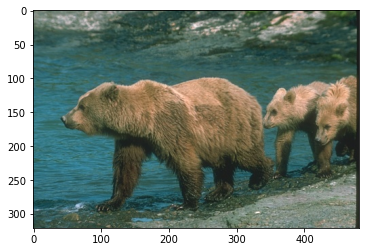

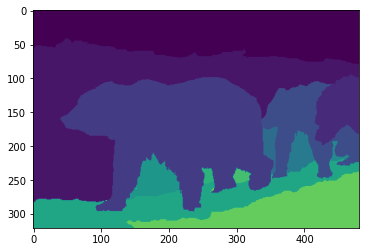

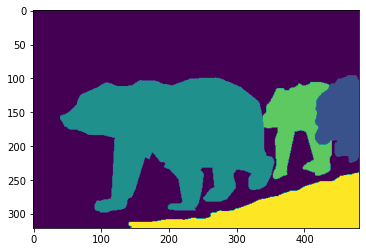

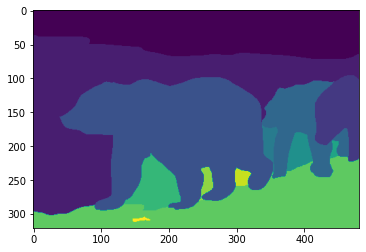

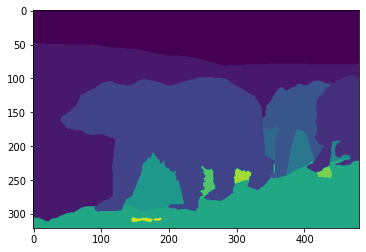

...

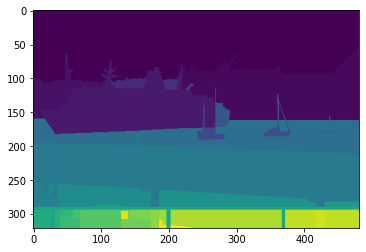

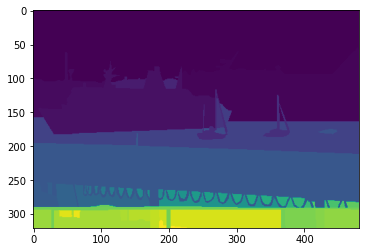

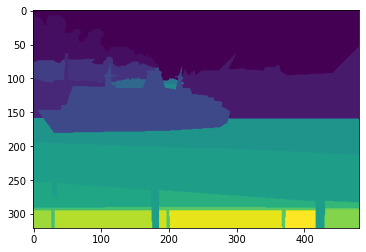

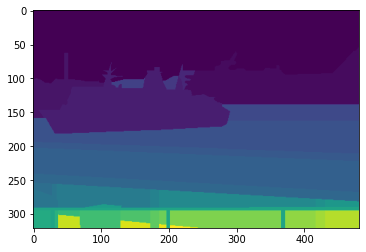

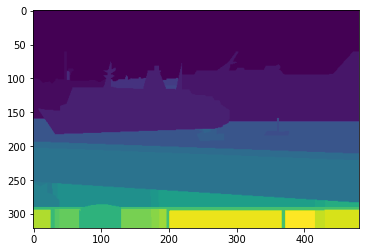

In [ ]:
def display_image_ground(training_data,training_ground):
  ground_array = [[0 for i in range(10)] for i in range(200)]
  for i in range(len(training_data)):
    if i%10 ==0:
      plt.imshow(training_data[i])
      plt.show()
    j=0
    while np.all(training_ground[i][j]) != 0:
      ground_array[i][j] = Image.fromarray(training_ground[i][j])
      if i%10 ==0:
        plt.imshow(ground_array[i][j])
        plt.show()
      j+=1
  return ground_array
ground_array = display_image_ground(training_data,training_ground)

# **3.K-means**

In [ ]:
import numpy as np
import cv2
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
def k_means(set,count):
  segments = np.zeros((200,5),object)
  k_label = np.zeros((200,5),object)
  k=[3,5,7,9,11]
  j=0
  for j in range(count):
    i=0
    for i in range(5):
      clt = KMeans(n_clusters = k[i])
      image = set[j]
      (h1, w1) = image.shape[:2]
      image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
      image = image.reshape((image.shape[0] * image.shape[1], 3))
      #print(image.shape)
      labels = clt.fit_predict(image)
      quant = clt.cluster_centers_.astype("uint8")[labels]
      k_label[j][i]=labels
      #print(quant.shape)
      quant = quant.reshape((h1, w1, 3))
      #print(quant.shape)
      image = image.reshape((h1, w1, 3))
      quant = cv2.cvtColor(quant, cv2.COLOR_LAB2BGR)
      image = cv2.cvtColor(image, cv2.COLOR_LAB2BGR)
      segments[j][i]=quant
      cv2.waitKey(0)
      cv2.destroyAllWindows()
  return k_label,segments

**k-means call**

In [ ]:
k_label,segments=k_means(training_data,5)
test_label,test_segments=k_means(test_data,50)

In [ ]:
def get_labels(ground_labels):
  ground_labels = np.resize(ground_labels,(154401))
  labels = []
  for j in range(154401):
    if len(labels) == 0:
      labels.append(ground_labels[j])
    else:
      flag =0
      for k in range(len(labels)):
        if ground_labels[j] == labels[k]:
          flag = 1
      if flag ==0:
        labels.append(ground_labels[j])
  return labels
ground_labels = [[0 for i in range(10)] for j in range(50)] 
for i in range(50):
  for j in range(10):
    if np.all(test_ground[i][j]) != 0:
      ground_labels[i][j]=get_labels(test_ground[i][j])

[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [5 5 5 ... 5 5 5]
 [5 5 5 ... 5 5 5]
 [5 5 5 ... 5 5 5]]
0 0 [1, 2, 3, 4, 5]
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [7 7 7 ... 7 7 7]
 [7 7 7 ... 7 7 7]
 [7 7 7 ... 7 7 7]]
0 1 [1, 2, 3, 4, 5, 6, 7]
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [7 7 7 ... 7 7 7]
 [7 7 7 ... 7 7 7]
 [7 7 7 ... 7 7 7]]
0 2 [1, 2, 3, 4, 5, 6, 7, 8]
[[ 1  1  1 ...  1  1  1]
 [ 1  1  1 ...  1  1  1]
 [ 2  2  2 ...  1  1  1]
 ...
 [13 13 13 ... 13 13 13]
 [13 13 13 ... 13 13 13]
 [13 13 13 ... 13 13 13]]
0 3 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
[[ 1  1  1 ...  3  3  3]
 [ 1  1  1 ...  3  3  3]
 [ 1  1  1 ...  3  3  3]
 ...
 [19 19 19 ... 19 19 19]
 [19 19 19 ... 19 19 19]
 [19 19 19 ... 19 19 19]]
0 4 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
[[1 1 1 ... 7 7 7]
 [1 1 1 ... 7 7 7]
 [1 1 1 ... 7 7 7]
 ...
 [5 5 5 ... 7 7 7]
 [5 5 5 ... 7 7 7]
 [5 5 5 ... 7 7 7]]
1 0 [1, 2, 3,

# **F-measure**

In [ ]:
def f_measure(k,k_labels,ground_labels):
  total_fmeasure = [[0 for i in range(len(k))]for j in range(50)]
  for i in range(50):#loop for images
    for y in range(len(k)): #loop for Ks
      j= 0
      clusters = [0 for i in range(k[y])]
      f_measure_k =[]
      while np.all(test_ground[i][j]) != 0:#loop on all the ground truths of an image
        precision = []
        recall = []
        fmeasure =[0 for i in range(k[y])]
        classes_in_cluster = [[0 for x in range(len(ground_labels[i][j])+1)]for y in range(k[y])] #array to count the number of pixels belonging to every class in every cluster
        ground_truth = test_ground[i][j].reshape(154401) #store the values of every ground truth and reshape it to 154401 columns
        classes_in_ground = [] # list to determine the number every class appeared in the ground truth to calculate the precision
        for x in range(len(ground_labels[i][j])):
          tmp=0
          for c in range(len(ground_truth)):
            if ground_truth[c] == ground_labels[i][j][x]:
              tmp+=1
          classes_in_ground.append(tmp)
        for x in range(154401):
          clusters[k_labels[i][y][x]]+=1 # increment the number of objects in the cluster
          classes_in_cluster[k_labels[i][y][x]][ground_truth[x]]+=1 #increment the number of objects in a class(ground_truth[x]) in cluster(k_labels)
        f_measure_k.append(0)
        for z in range(k[y]):
          for c in range(len(ground_labels[i][j])):
            if classes_in_cluster[z][c] != 0 and classes_in_ground[c] !=0:
              precision = classes_in_cluster[z][c]/clusters[z]
              recall = classes_in_cluster[z][c]/classes_in_ground[c]
              fmeasure[z] = (2*precision*recall)/(precision + recall )
        for z in range(k[y]):
          f_measure_k[j] += fmeasure[z]
        j+=1
        if np.all(test_ground[i][j-1]) != 0 and np.all(test_ground[i][j]) == 0:
          total_fmeasure[i][y] = f_measure_k
  return total_fmeasure

In [ ]:
total_fmeasure = f_measure([3,5,7,9,11],test_label,ground_labels)
images = ["first","second","third","fourth","fifth"]
Ks = [3,5,7,9,11]
j=0
average_fmeasures=[[0 for i in range(len(Ks))] for j in range(len(total_fmeasure)) ]
for i in range(len(total_fmeasure)):
  for j in range(len(total_fmeasure[0])):
    average_fmeasures[i][j] = (np.sum(total_fmeasure[i][j])/len(total_fmeasure[i][j]))
    print("Kmeans k = ",Ks[j])
    print("The f-measure for the image",i," image with ",len(total_fmeasure[i][j])," ground truths: ",total_fmeasure[i][j])
    print("The average of the f-measures of the image ",i," image is: ",average_fmeasures[i][j] )
    print()
    print()
f_total=np.zeros(5)    
for i in range(len(total_fmeasure[0])):
  print("Kmeans k = ",Ks[i])
  print("The average of all the images = ",np.sum(average_fmeasures[:][i])/len(total_fmeasure))
  f_total[i]=np.sum(average_fmeasures[:][i])/len(total_fmeasure)

Kmeans k =  3
The f-measure for the image 0  image with  5  ground truths:  [0.024114691618003788, 0.010295557271965464, 0.33663818904446796, 0.00010483965409352329, 0.0010046836401675615]
The average of the f-measures of the image  0  image is:  0.07443159224573966


Kmeans k =  5
The f-measure for the image 0  image with  5  ground truths:  [0.03304305661247061, 0.016342771651861054, 0.5062473507637117, 0.0004569983754806936, 0.0026636877274232927]
The average of the f-measures of the image  0  image is:  0.11175077302618949


Kmeans k =  7
The f-measure for the image 0  image with  5  ground truths:  [0.03650914912934493, 0.018891541335940353, 0.9669332001079192, 0.0018152909485510927, 0.003609034108100659]
The average of the f-measures of the image  0  image is:  0.20555164312597127


Kmeans k =  9
The f-measure for the image 0  image with  5  ground truths:  [0.040312030010274044, 0.022274455153720722, 1.125354479166363, 0.0024911690566748754, 0.007413671402090486]
The average of 

# **Conditional Entropy**

In [ ]:
import math
def entropy(k,k_labels,ground_labels):
  total_entropy = [[0 for i in range(len(k))]for j in range(50)]
  for i in range(50): #loop for 5 images
    for y in range(len(k)):
      j=0 #counter for each image to get every possible ground truth
      total_entropy_k = [] # total entrioy for k_labels against every ground truth
      clusters = [0 for i in range(k[y])]
      while np.all(test_ground[i][j]) != 0:
        entropy = [0 for i in range(k[y])]
        classes_in_cluster = [[0 for x in range(len(ground_labels[i][j])+1)]for y in range(k[y])] #array to count the number of pixels belonging to every class in every cluster
        ground_truth = test_ground[i][j].reshape(154401) #store the values of every ground truth and reshape it to 154401 columns
        for x in range(154401):
          clusters[k_labels[i][y][x]]+=1 # increment the number of objects in the cluster
          #print(i,k[y],ground_truth[x],k_labels[i][y][x])
          classes_in_cluster[k_labels[i][y][x]][ground_truth[x]]+=1 #increment the number of objects in a class(ground_truth[x]) in cluster(k_labels)
        total_entropy_k.append(0)
        for z in range(k[y]):
          for c in range(len(ground_labels[i][j])+1):
            if classes_in_cluster[z][c] !=0: #to ensure there is no 0 in log function
              entropy[z] -= (classes_in_cluster[z][c]/clusters[z])*math.log10(classes_in_cluster[z][c]/clusters[z]) #the entropy for every class in every cluster and store in entropy[z] where z represents the cluster
        for z in range(k[y]):
          total_entropy_k[j] += (clusters[z]/154401)*entropy[z]
        j+=1
        if np.all(test_ground[i][j-1]) != 0 and np.all(test_ground[i][j]) == 0:
          total_entropy[i][y] = total_entropy_k
  return total_entropy

In [ ]:
total_entropy = entropy([3,5,7,9,11],test_label,ground_labels)
print(total_entropy)
images = ["first","second","third","fourth","fifth"]
Ks = [3,5,7,9,11]
j=0
average_entropies=[[0 for i in range(len(Ks))] for j in range(len(total_entropy)) ]
for i in range(len(total_entropy)):
  for j in range(len(total_entropy[0])):
    average_entropies[i][j] = (np.sum(total_entropy[i][j])/len(total_entropy[i][j]))
    print("Kmeans k = ",Ks[j])
    print("The entropies for the image",i," with ",len(total_entropy[i][j])," ground truths: ",total_entropy[i][j])
    print("The average of the entropies of the image ",i," is: ",average_entropies[i][j])
    print()
    print()
c_total=np.zeros(5)     
for i in range(len(total_entropy[0])):
  print("Kmeans k = ",Ks[i])
  print("The average of all the images = ",np.sum(average_entropies[:][i])/len(total_entropy))
  c_total[i]= np.sum(average_entropies[:][i])/len(total_entropy)

[[[0.33338289806702903, 0.6547459858501634, 0.9129734992694093, 1.016482163824613, 1.1363586163933548], [0.3168154405608523, 0.6374629881803076, 0.8924122828474628, 0.9964276480576578, 1.1115825205357395], [0.2654386181111759, 0.5861406184316494, 0.8384903051813686, 0.9429895392696599, 1.0563705485122714], [0.26587526493390856, 0.5860889209994518, 0.8373394106023705, 0.9425708179964308, 1.05388909031727], [0.18764329484996048, 0.5078400933267072, 0.7591054119448049, 0.8641556617881171, 0.9749478941554308]], [[0.521252744292065, 1.2318013822262897, 0.9461876070797114, 1.0715241067829055, 1.40247623558795], [0.4886155348331591, 1.177474661390395, 0.9142889722118683, 1.0395972907638937, 1.3611044601997944], [0.44618707907287725, 1.12442616950325, 0.8703655788648014, 0.9953465850846726, 1.3125737366613222], [0.4322081544019121, 1.1024560191454178, 0.855487642664538, 0.9806810255392399, 1.2953742370234675], [0.42075058457747777, 1.0855063670155274, 0.8438678869895918, 0.9691475961756857, 1.

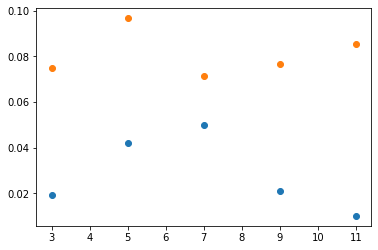

In [ ]:
plt.scatter(Ks,f_total )
plt.scatter(Ks,c_total)
plt.show()

# **4.a.**

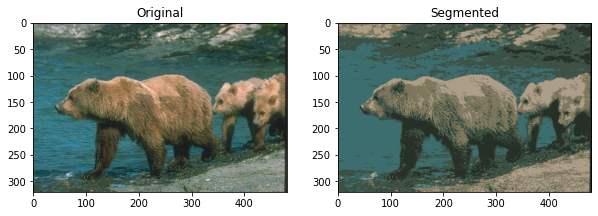

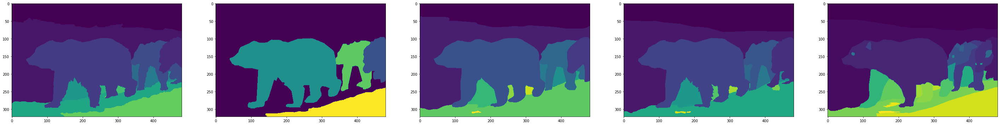

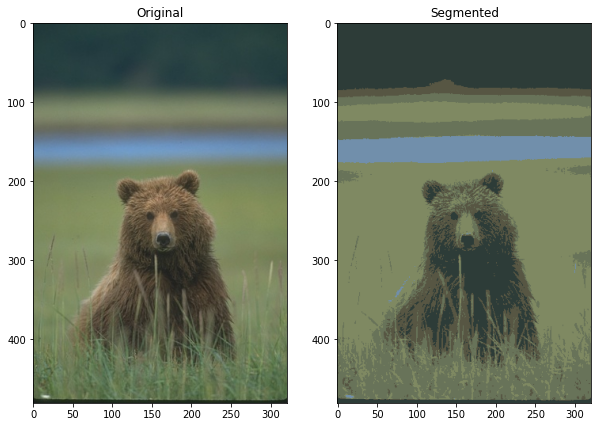

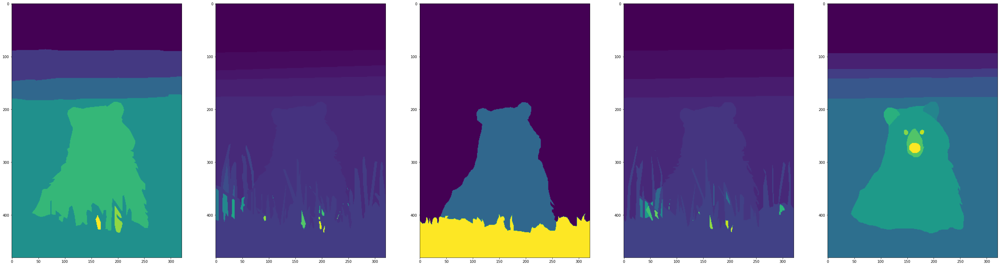

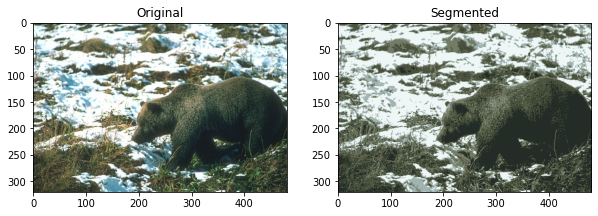

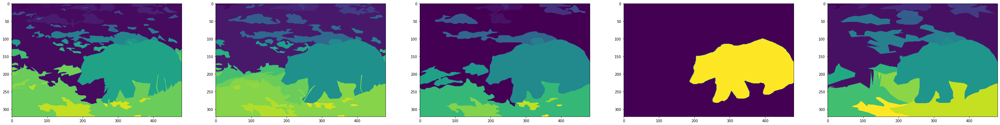

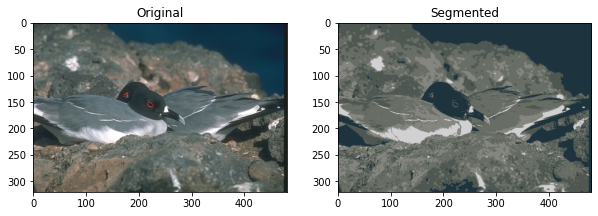

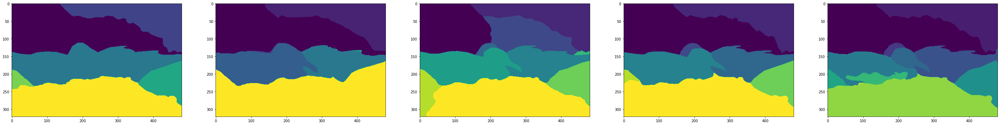

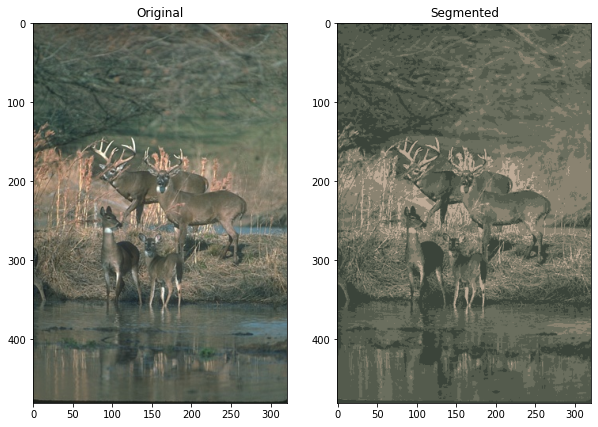

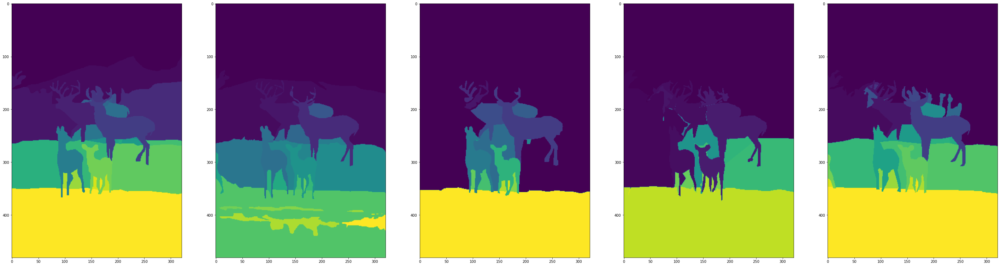

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
for i in range(5):
  fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(10,10))
  ax1.imshow(training_data[i])
  ax2.imshow(segments[i][1])
  ax1.set_title('Original')
  ax2.set_title('Segmented')
  plt.show()
  fig, axs = plt.subplots(1, 5,figsize=(50,50))
  for j in range(5):
    axs[j].imshow(ground_array[i][j])
  plt.show()


# **Spectral clustering**

In [ ]:
from sklearn.metrics import pairwise_distances
from sklearn.cluster import SpectralClustering
def spectral_Clustering():
  new_images =[]
  for i in range(5):
    vectorized = []
    image = training_data[i]
    image_data = np.asarray(image)
    res = cv2.resize(image_data, dsize=(100, 100), interpolation=cv2.INTER_CUBIC)
    data_img=cv2.GaussianBlur(res,(7,7),0)
    unrolled=data_img.reshape(-1,3)
    vectorized.append(unrolled)
    vec_train_img=np.array(vectorized)
    distance_matrix= pairwise_distances(unrolled, metric='euclidean')
    affinity = []
    for row in distance_matrix:
      for d in row:
        aff= np.exp(-0.01 * d ** 2)
        affinity.append(aff)
    affinity = np.array(affinity)
    affinity=affinity.reshape(10000,10000)
    clustering = SpectralClustering(n_clusters=5, assign_labels="discretize", affinity="precomputed").fit(affinity)
    colors = [[52,52,52],[126, 160, 246],[255,255,255],[255,51,51],[102,204,0],[0,255,255],[173, 236, 135],[51,51,255],[126, 0, 151],[200,200,200],[100,100,100]]
    newImage = []
    for k in range(0,10000):
      newImage.append(colors[clustering.labels_[k]])
    newImage=np.array(newImage).reshape(100,100,3)
    new_images.append(newImage)
  return new_images
new_images = spectral_Clustering() 

# **4.b**

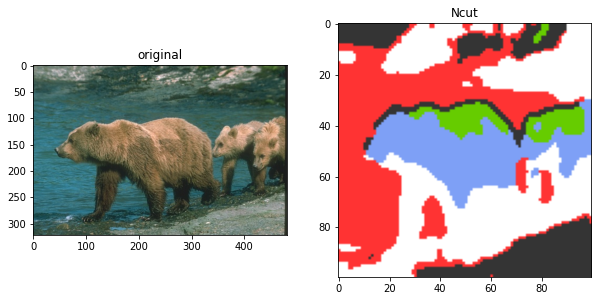

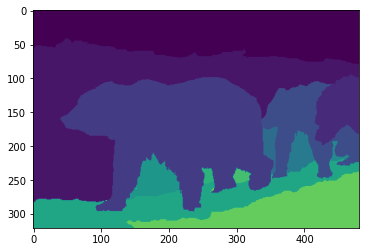

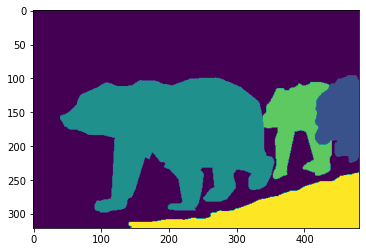

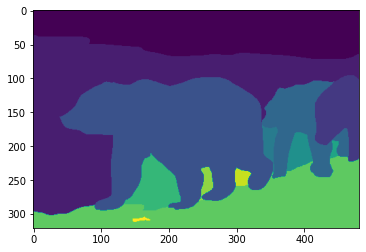

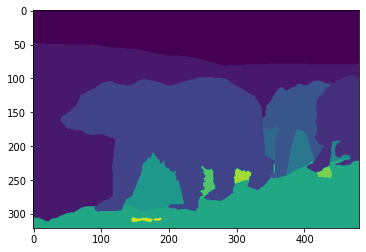

...

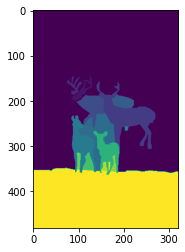

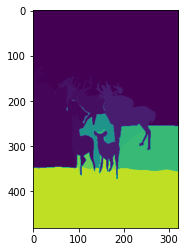

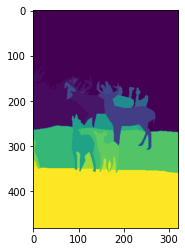

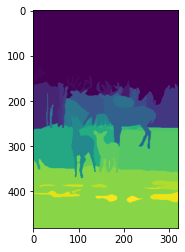

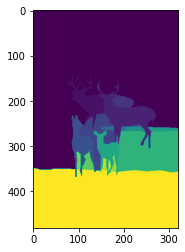

In [ ]:
def display_Ncut_ground(new_images):
  for i in range(5):
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(10,10))
    ax1.imshow(training_data[i])
    ax2.imshow(new_images[i])
    ax1.set_title('original')
    ax2.set_title('Ncut')
    plt.show()
    for j in range(10):
      if np.all(ground_array[i][j]) !=0:
        plt.imshow(ground_array[i][j])
        plt.show()
display_Ncut_ground(new_images)

# **4.c**

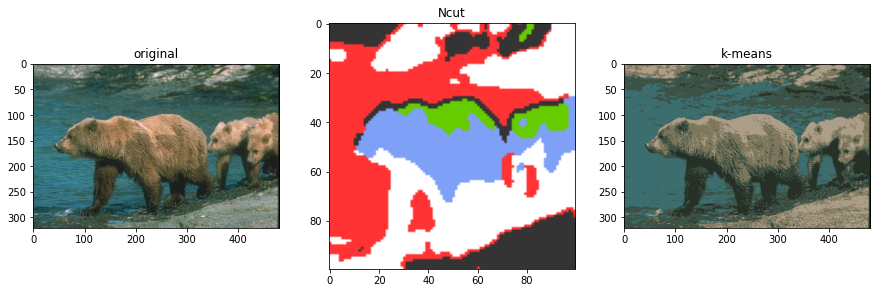

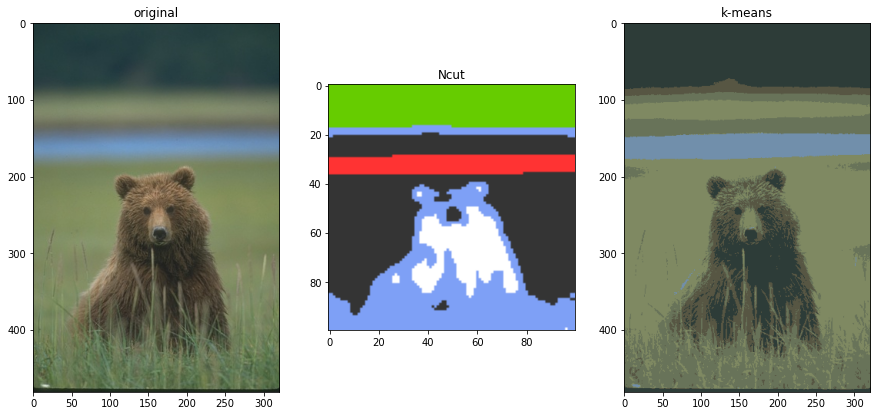

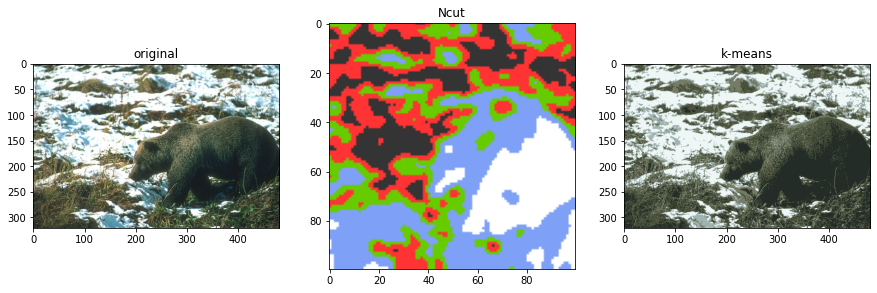

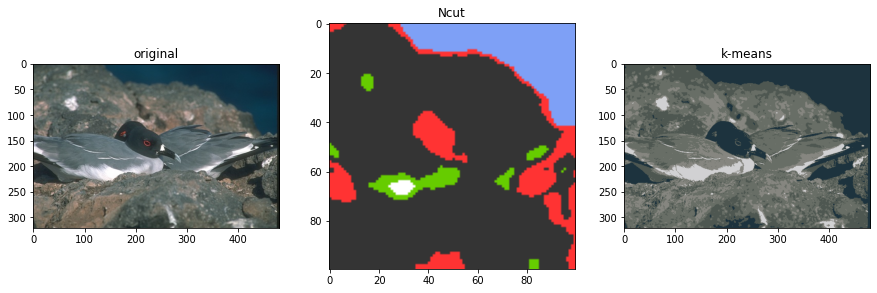

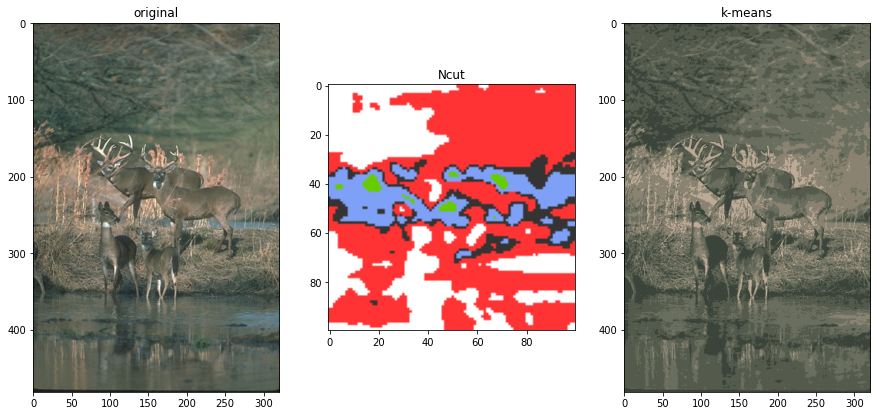

In [ ]:
def display_Ncut_kmeans(new_images):
  for i in range(0,5):
    fig, (ax1, ax2,ax3) = plt.subplots(1, 3,figsize=(15,15))
    ax1.imshow(training_data[i])
    ax2.imshow(new_images[i])
    ax3.imshow(segments[i][1])
    ax1.set_title('original')
    ax2.set_title('Ncut')
    ax3.set_title('k-means')
    plt.show()
display_Ncut_kmeans(new_images)